In [53]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm
from scipy.optimize import minimize, differential_evolution
import scipy
import random
import theano
import theano.tensor as T
from lasagne.updates import adam

In [7]:
# test func
# Levi function №13
# f(1,1) = 0 - global min
# -10 <= x, y <= 10
def levi_13(x):  
    return (np.sin(3 * np.pi * x[0])) ** 2 + ((x[0] - 1) ** 2) * (1 + (np.sin(3 * np.pi * x[1])) ** 2) + ((x[1] - 1) ** 2) * (1 + np.sin(2 * np.pi * x[1]) ** 2)

In [70]:
X[0] = np.linspace(-10,10,num=3000)
X[1] = np.linspace(-10,10,num=3000)
X = np.meshgrid(X[0],X[1])
Z = levi_13(X)

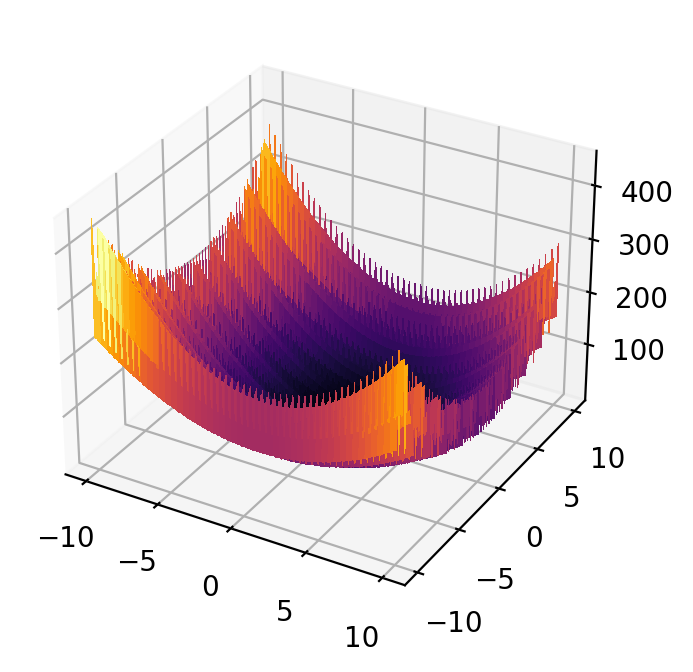

In [71]:
fig = plt.figure(dpi = 200)
ax = fig.gca(projection='3d')
surf = ax.plot_surface(X[0], X[1], Z, cmap=cm.inferno,
                       linewidth=0, antialiased=False)
plt.show()

## CG
Метод сопряженных градиентов (модификация ГС).Координата высоты найденного минимума варьируется от 0(глобальный минимум) до 150

In [48]:
cg = minimize(levi_13, random.uniform(-10, 10), random.uniform(-10, 10), method='CG', options={'disp': True})

Optimization terminated successfully.
         Current function value: 26.938442
         Iterations: 5
         Function evaluations: 32
         Gradient evaluations: 16


## Adam
На первых итерациях алгоритм "проскакивает" множество локальных минимумов, после чего все равно застревает в одном из них, однако, продемонстрированный результат значительно выше, чем при использовании CG.

Из представленных алгоритмов в процессе выполнения оказался наиболее времязатратным. 

In [95]:
weights = np.asarray([[random.uniform(-10, 10)], [random.uniform(-10, 10)]])
W = theano.shared(weights)
Wprobe = T.matrix('weights')

levi = (np.sin(3 * np.pi * W[0][0])) ** 2 + ((W[0][0] - 1) ** 2) * (1 + (np.sin(3 * np.pi * W[1][0])) ** 2) + ((W[1][0] - 1) ** 2) * (1 + np.sin(2 * np.pi * W[1][0]) ** 2)

result_probe = theano.function([Wprobe], levi, givens=[(W, Wprobe)])

updates = adam(levi, [W], learning_rate=2.0)
train_fnc = theano.function(inputs=[], outputs=levi, updates=updates)


prev_result_val = 10**5
iterations = 0
while True:
    result_val = train_fnc()
    iterations += 1
    if abs(prev_result_val - result_val) < 1e-2:
        break
    prev_result_val = result_val

print('Min: ' + str(result_val) + '\nIterations: ' + str(iterations))

Min: 1.3817385441705958
Iterations: 364


## Differential evolution
В отличие от CG, полученные координаты минимума не зависят от совокупности изначально взятых случайных точек/точки. Число итераций варьируется между 85 и 120.

In [110]:
bounds = [(-10,10), (-10, 10)]
differential_evolution(levi_13, bounds)

     fun: 7.40725615604377e-29
 message: 'Optimization terminated successfully.'
    nfev: 2973
     nit: 98
 success: True
       x: array([1., 1.])